In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import 

In [4]:
# Load dataset
df = pd.read_csv("/kaggle/input/ecommerce-consumer-behavior-analysis-data/Ecommerce_Consumer_Behavior_Analysis_Data.csv")

In [5]:
# Overview of dataset
print("--- Dataset Overview ---")
print(df.info())
print("\n--- Summary Statistics ---")
print(df.describe())

--- Dataset Overview ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Customer_ID                            1000 non-null   object 
 1   Age                                    1000 non-null   int64  
 2   Gender                                 1000 non-null   object 
 3   Income_Level                           1000 non-null   object 
 4   Marital_Status                         1000 non-null   object 
 5   Education_Level                        1000 non-null   object 
 6   Occupation                             1000 non-null   object 
 7   Location                               1000 non-null   object 
 8   Purchase_Category                      1000 non-null   object 
 9   Purchase_Amount                        1000 non-null   object 
 10  Frequency_of_Purchase                  1000 non-

In [6]:
# Identify numerical and categorical features
num_features = df.select_dtypes(include=['number']).columns
cat_features = df.select_dtypes(include=['object']).columns

In [7]:
# Handle missing values
for column in num_features:
    df[column].fillna(df[column].mean(), inplace=True)
for column in cat_features:
    df[column].fillna(df[column].mode()[0], inplace=True)

<ipython-input-7-b51788272717>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(df[column].mean(), inplace=True)
<ipython-input-7-b51788272717>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usin

In [8]:
# Remove duplicate entries
df.drop_duplicates(inplace=True)

In [9]:
# Detect and treat outliers using IQR
Q1 = df[num_features].quantile(0.25)
Q3 = df[num_features].quantile(0.75)
IQR = Q3 - Q1
outlier_mask = (df[num_features] < (Q1 - 1.5 * IQR)) | (df[num_features] > (Q3 + 1.5 * IQR))
df[num_features] = df[num_features].mask(outlier_mask, np.nan)
df[num_features].fillna(df[num_features].mean(), inplace=True)

<ipython-input-9-e85354dcc46a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[num_features].fillna(df[num_features].mean(), inplace=True)


In [10]:
# Standardize categorical values
if 'category_column' in df.columns:
    df['category_column'] = df['category_column'].str.lower().str.strip()
    df['category_column'].replace({'mistake1': 'corrected_value', 'mistake2': 'corrected_value'}, inplace=True)

In [11]:
# Univariate Analysis
print("\n--- Univariate Analysis ---")
print(df[num_features].describe())
print("\nMode:")
print(df[num_features].mode().iloc[0])
print("\nVariance:")
print(df[num_features].var())
print("\nSkewness:")
print(df[num_features].skew())


--- Univariate Analysis ---
               Age  Frequency_of_Purchase  Brand_Loyalty  Product_Rating  \
count  1000.000000            1000.000000    1000.000000     1000.000000   
mean     34.304000               6.945000       3.026000        3.033000   
std       9.353238               3.147361       1.416803        1.436654   
min      18.000000               2.000000       1.000000        1.000000   
25%      26.000000               4.000000       2.000000        2.000000   
50%      34.500000               7.000000       3.000000        3.000000   
75%      42.000000              10.000000       4.000000        4.000000   
max      50.000000              12.000000       5.000000        5.000000   

       Time_Spent_on_Product_Research(hours)  Return_Rate  \
count                            1000.000000  1000.000000   
mean                                1.013030     0.954000   
std                                 0.791802     0.810272   
min                                 0.0000

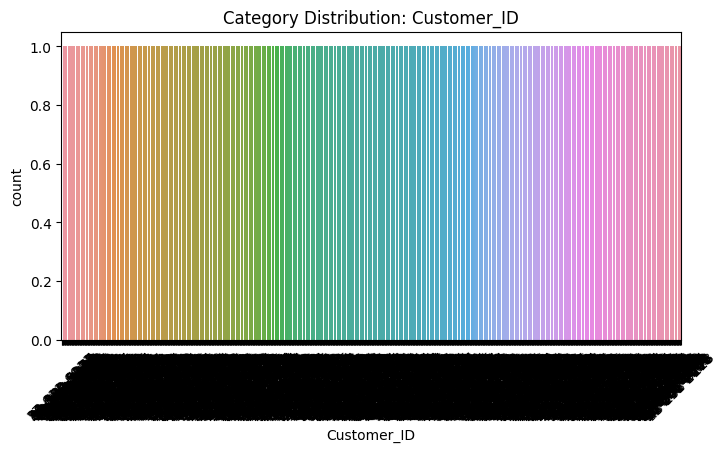

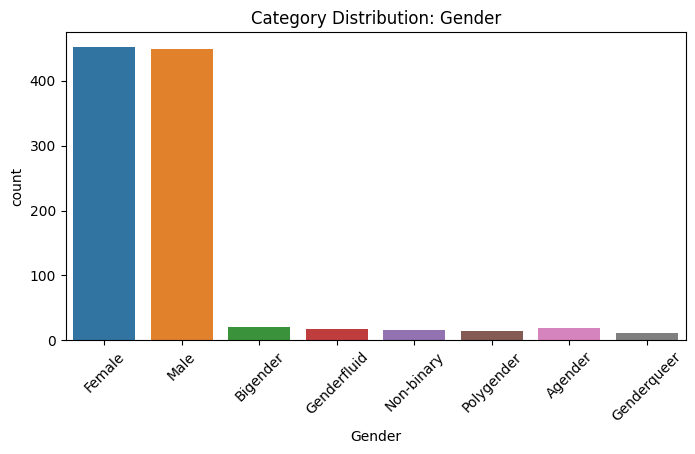

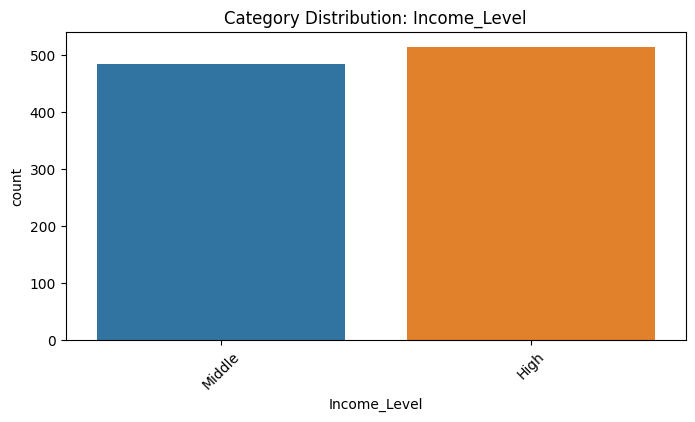

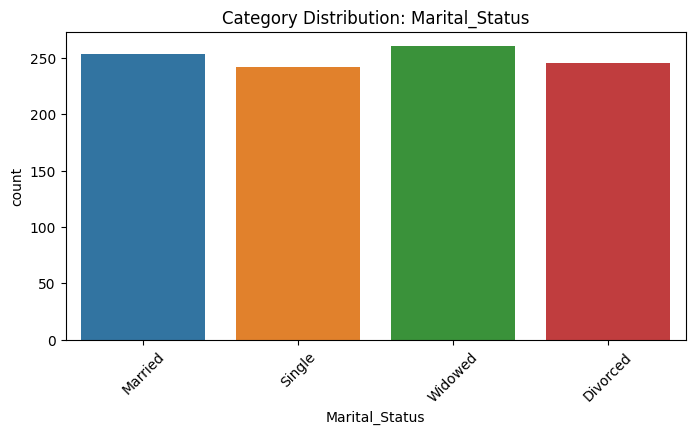

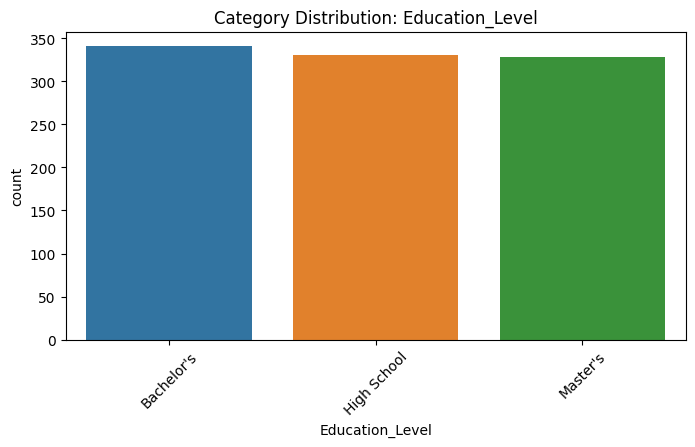

...

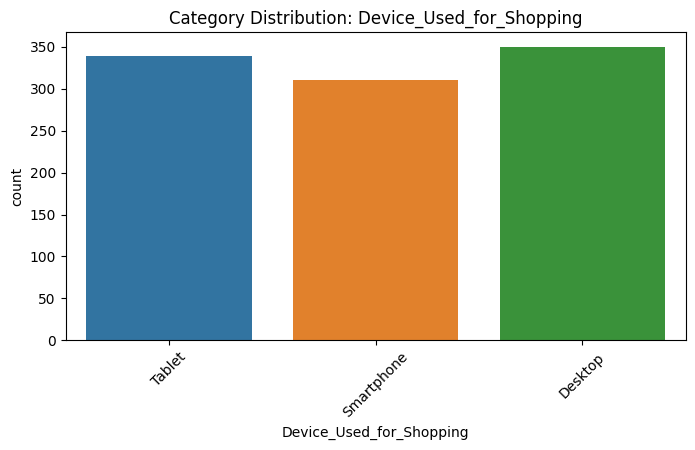

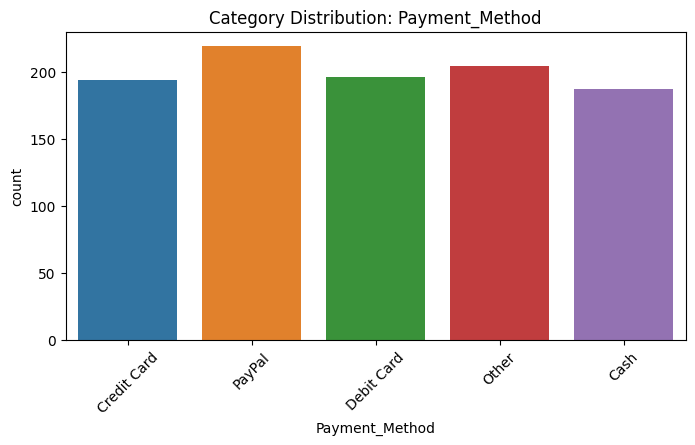

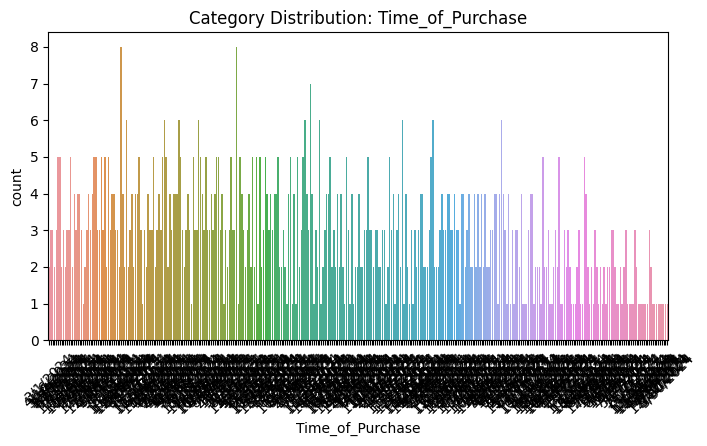

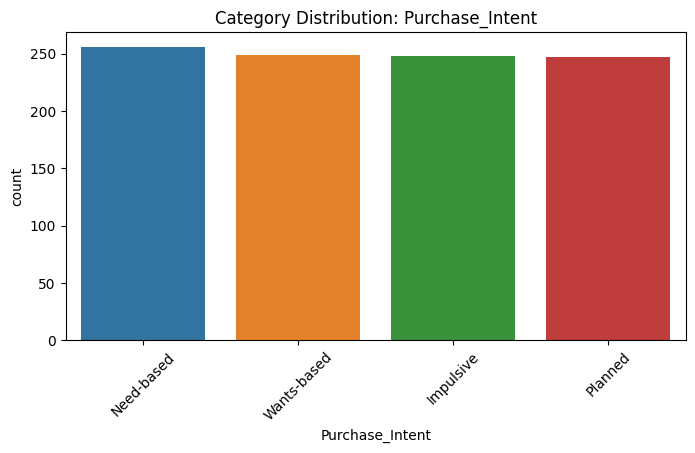

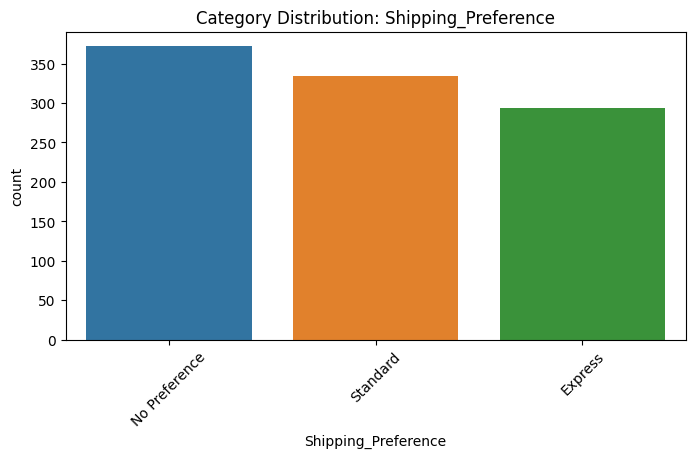

In [12]:
# Visualizing categorical variables
for col in cat_features:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, x=col)
    plt.title(f'Category Distribution: {col}')
    plt.xticks(rotation=45)
    plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


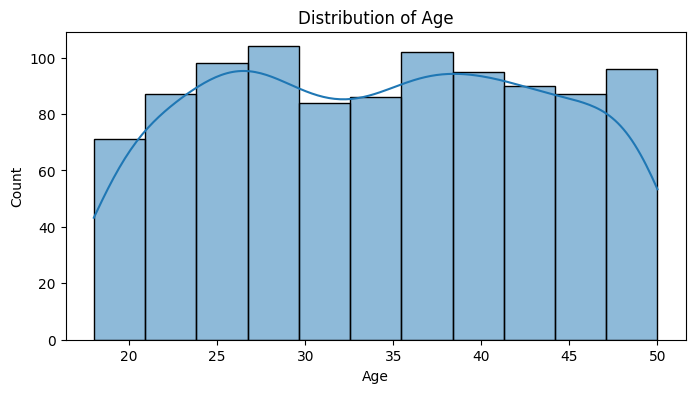

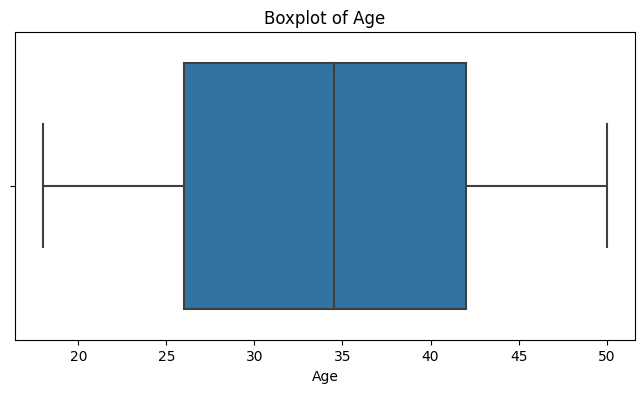

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


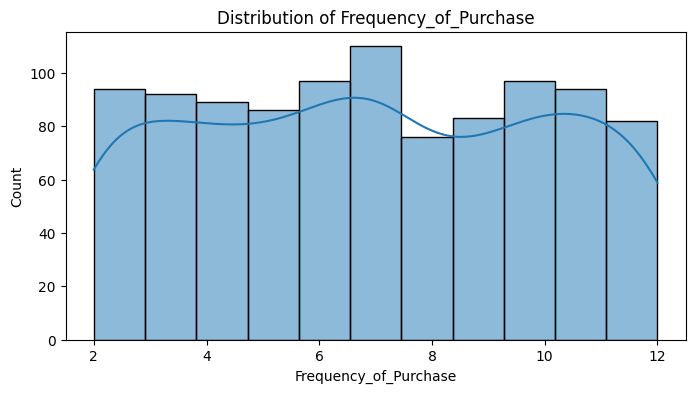

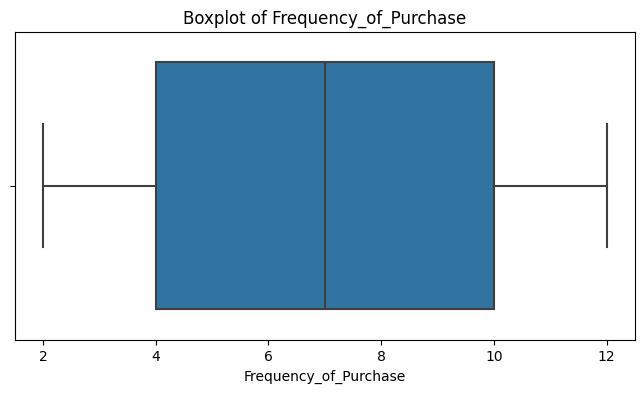

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


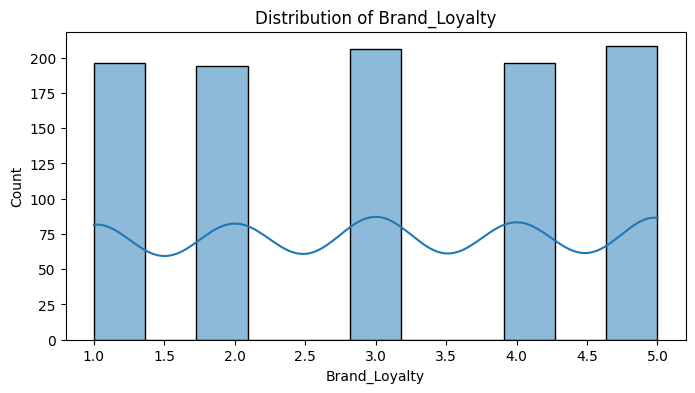

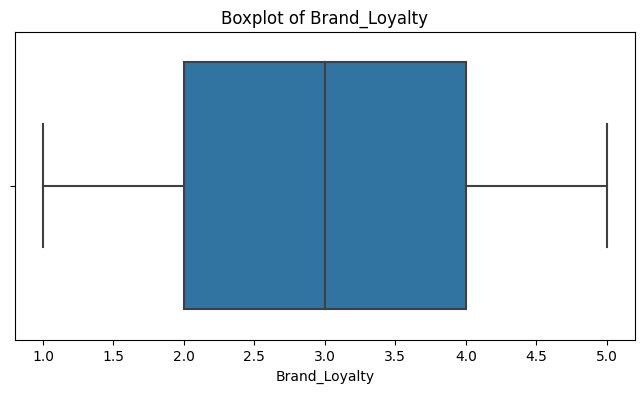

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


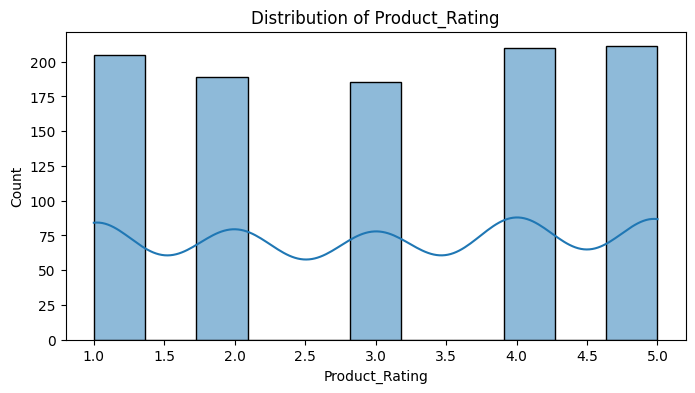

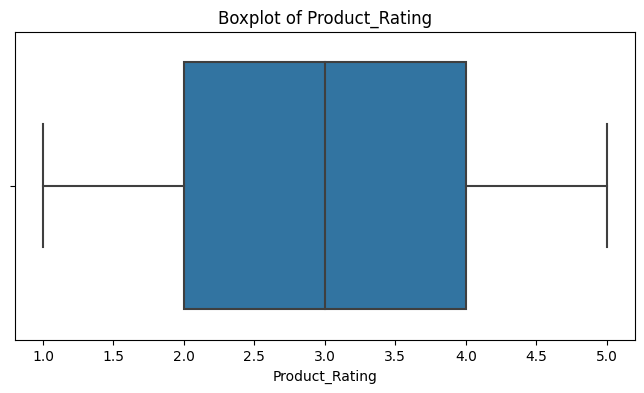

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


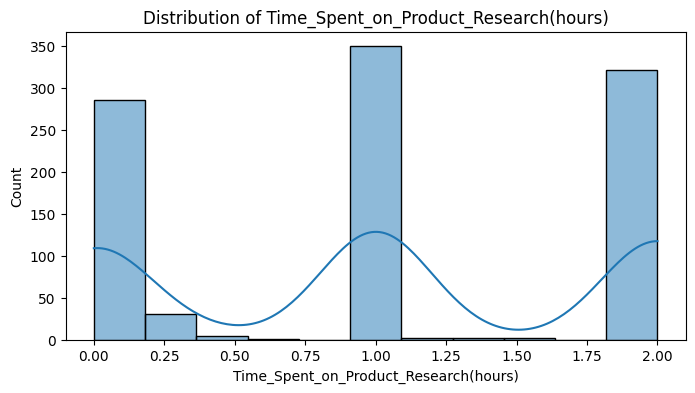

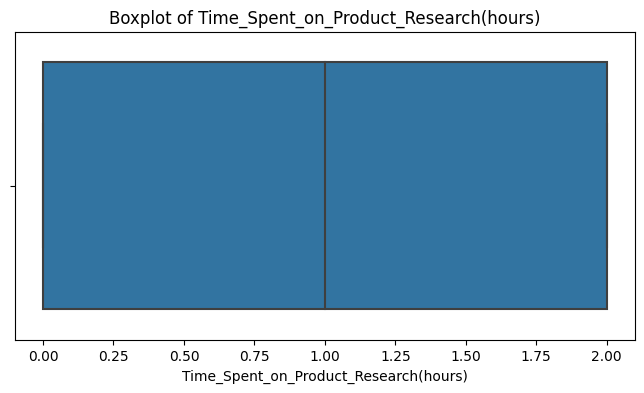

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


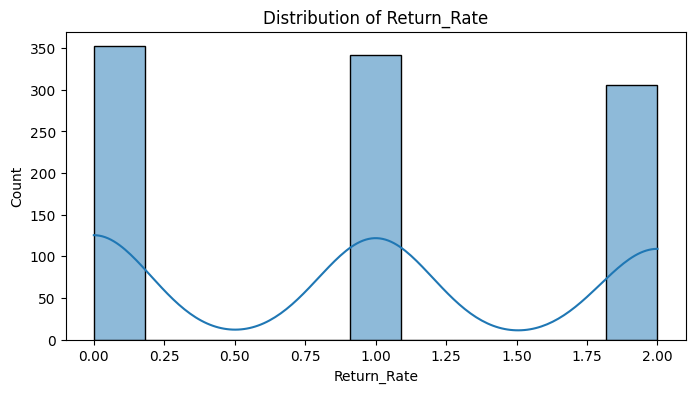

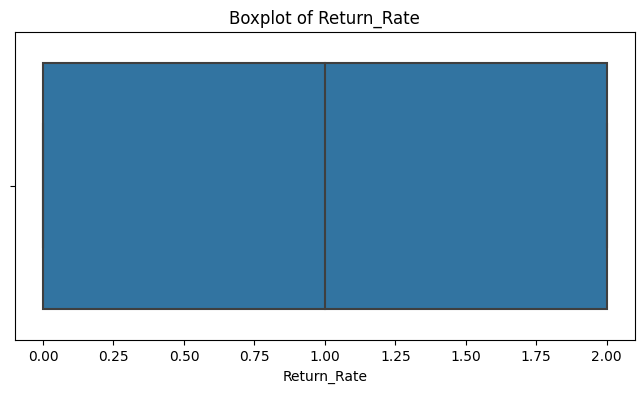

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


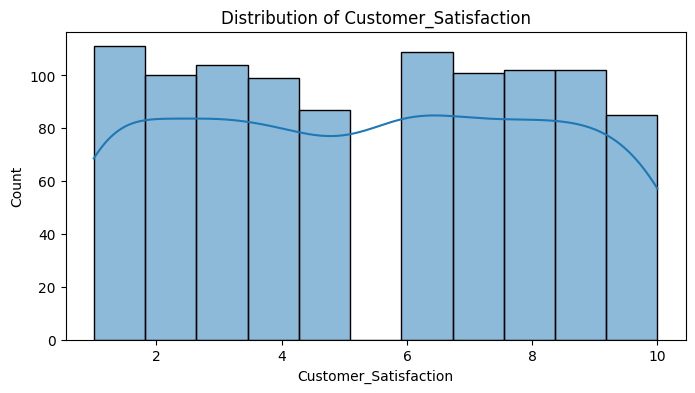

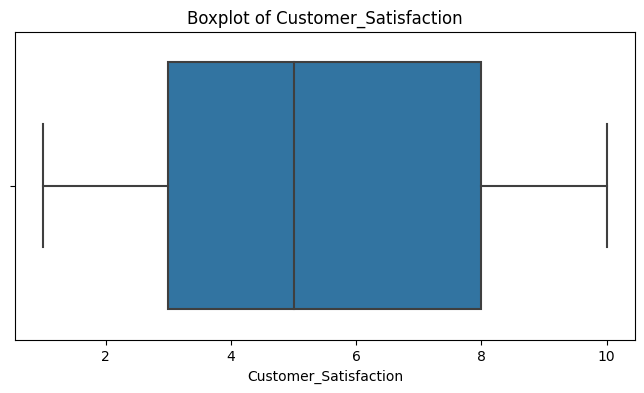

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


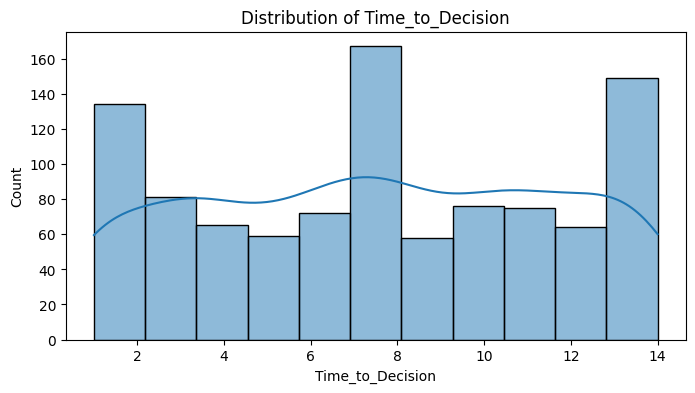

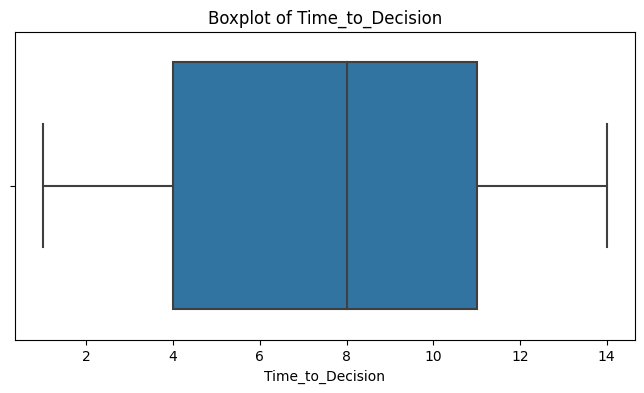

In [13]:
# Visualizing numerical variables
for col in num_features:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()
    
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

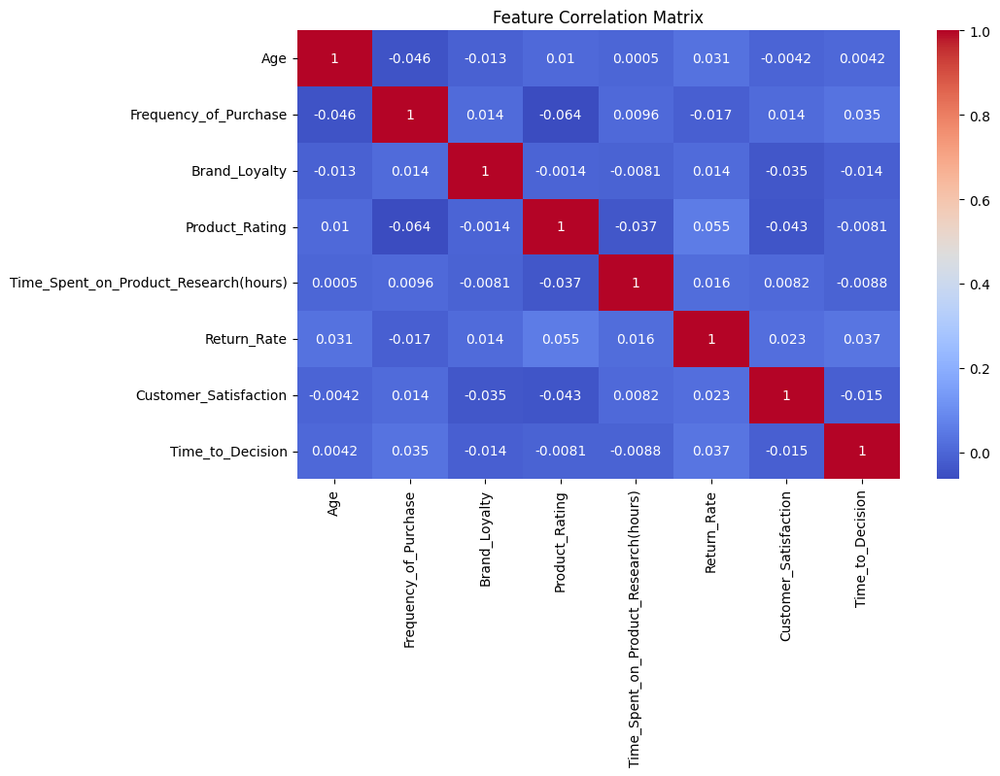

In [14]:
# Bivariate Analysis - Correlation Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df[num_features].corr(), annot=True, cmap='coolwarm')
plt.title("Feature Correlation Matrix")
plt.show()

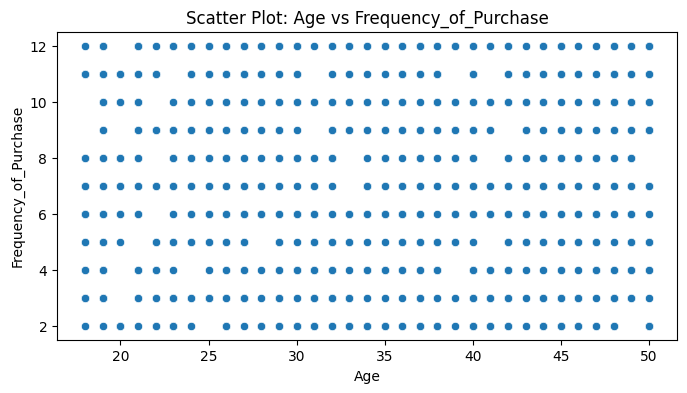

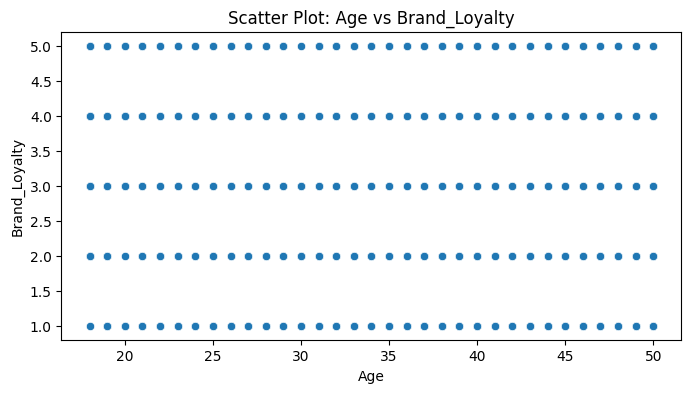

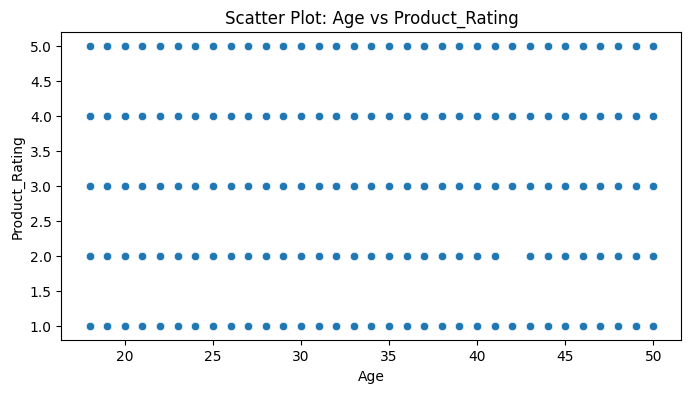

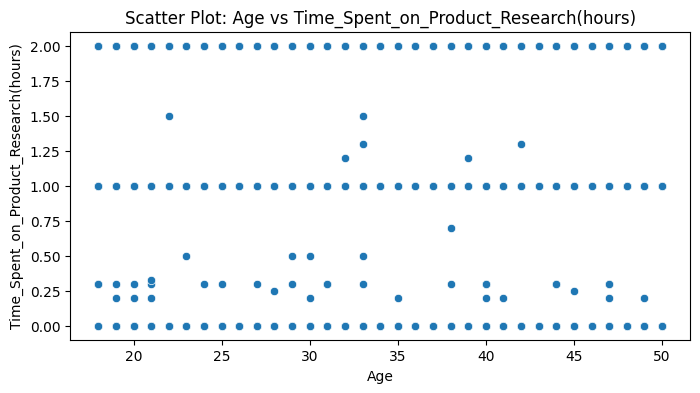

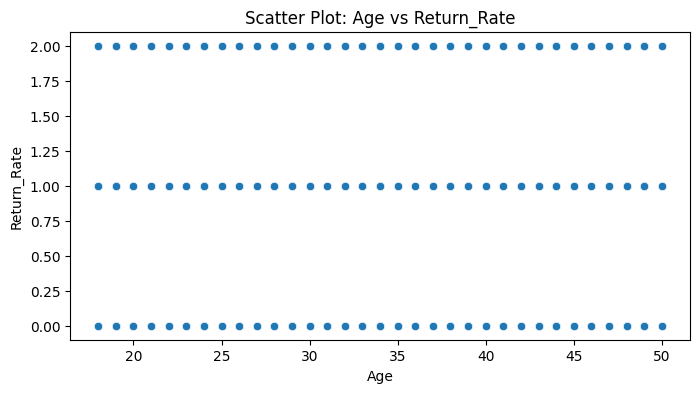

...

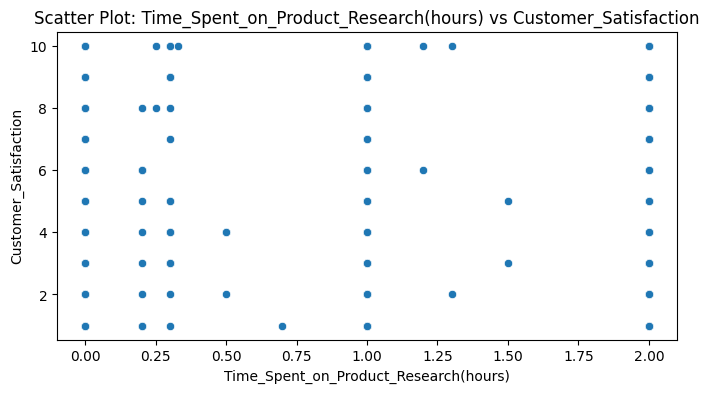

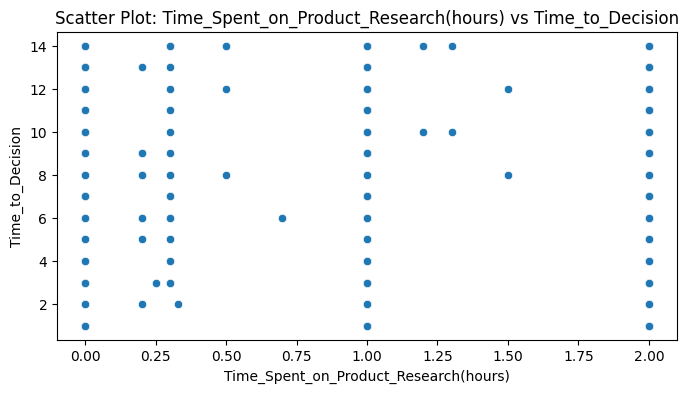

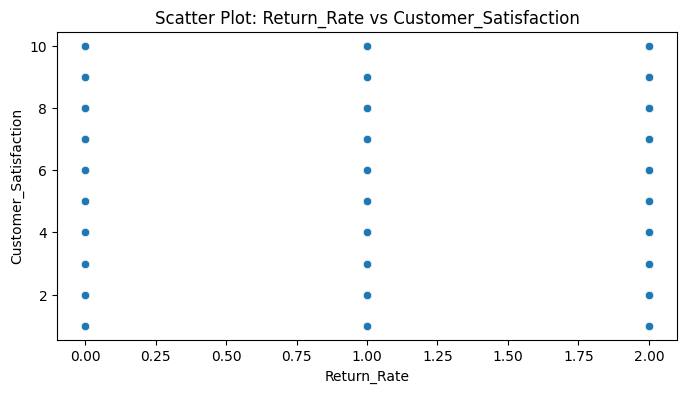

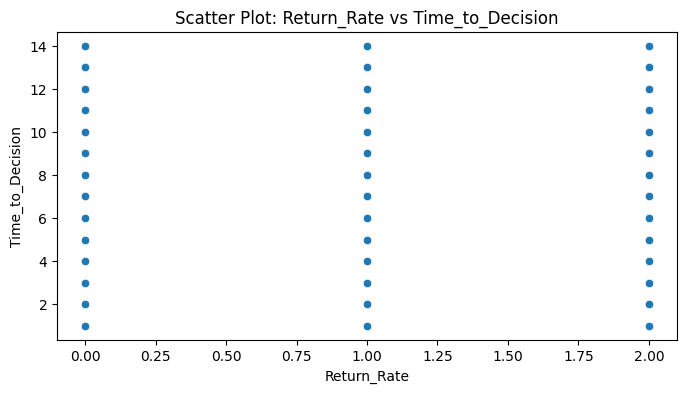

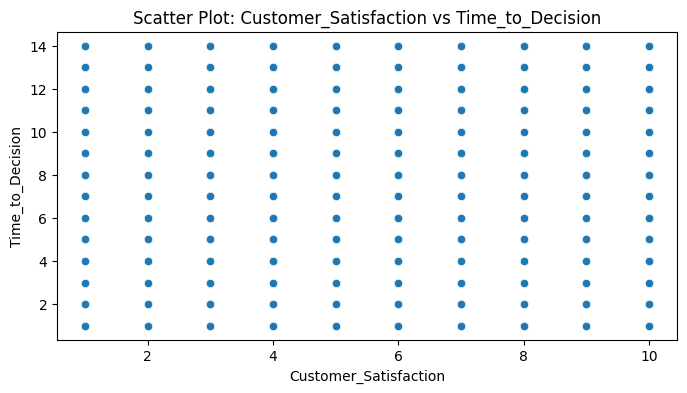

In [15]:
# Scatter Plots for Numerical Relationships
for x in range(len(num_features)):
    for y in range(x + 1, len(num_features)):
        plt.figure(figsize=(8, 4))
        sns.scatterplot(data=df, x=num_features[x], y=num_features[y])
        plt.title(f'Scatter Plot: {num_features[x]} vs {num_features[y]}')
        plt.show()

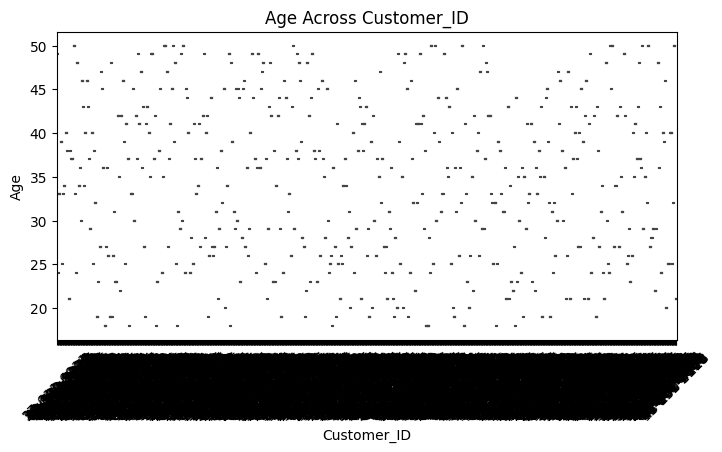

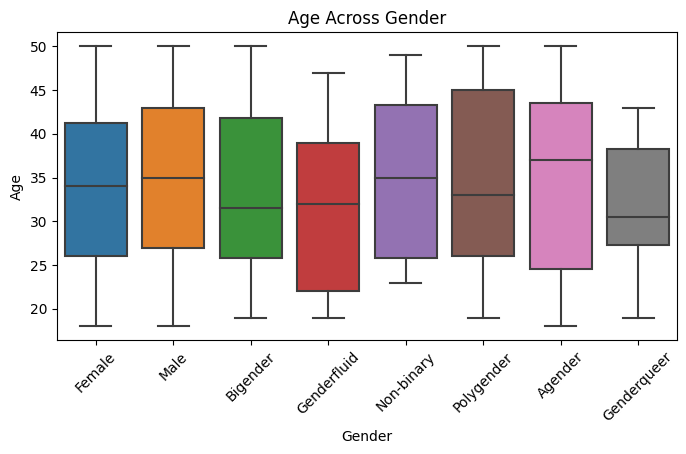

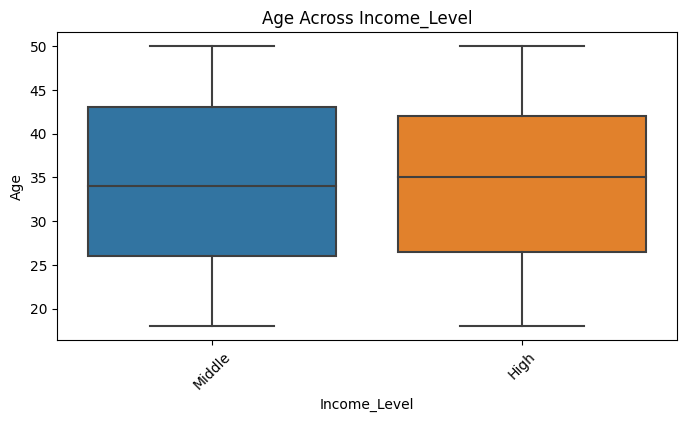

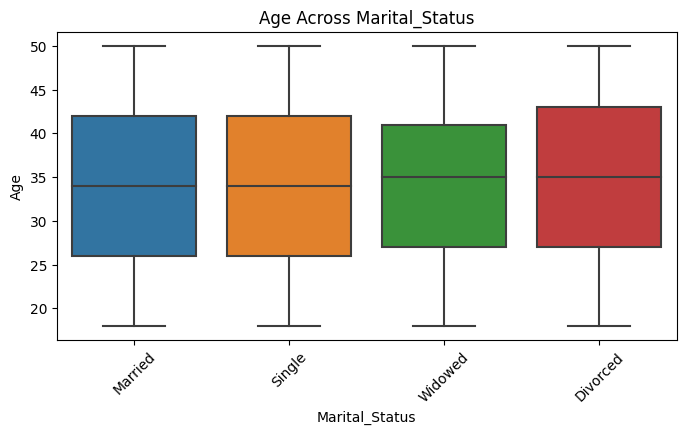

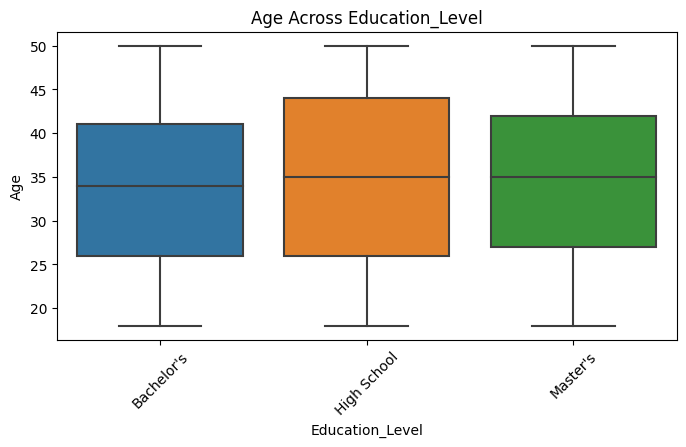

...

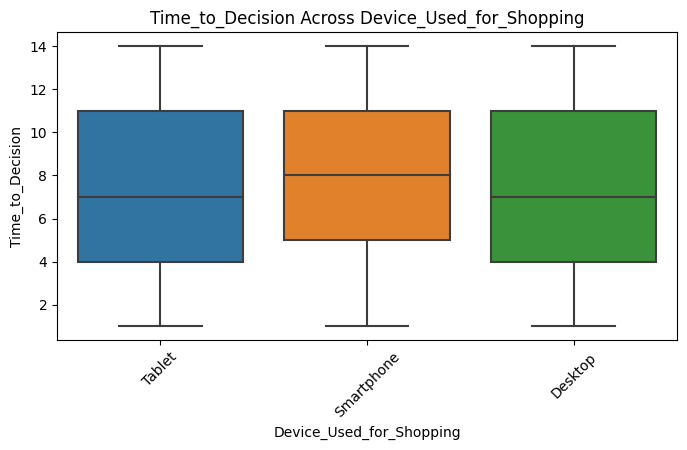

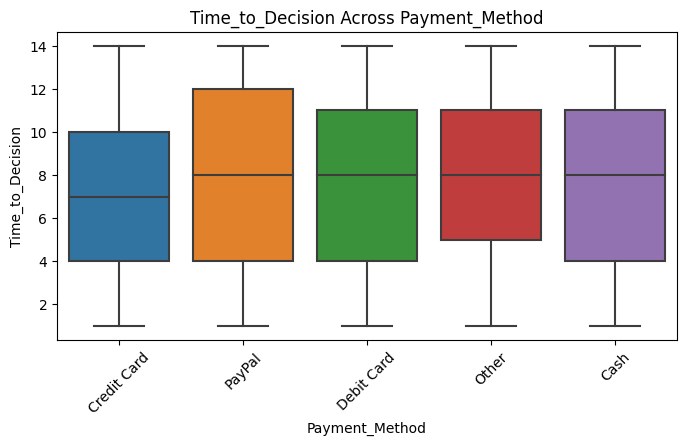

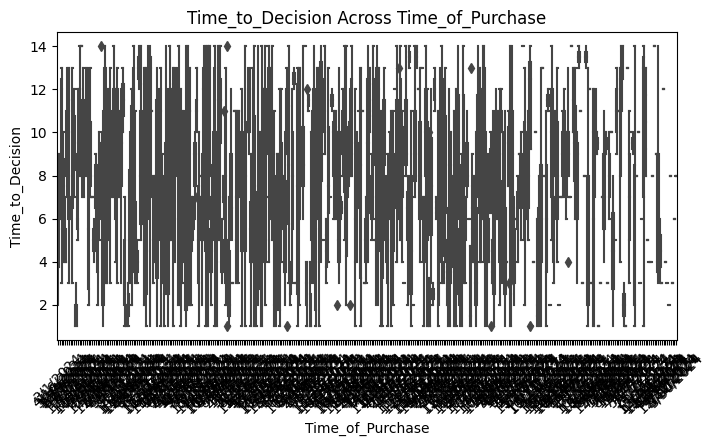

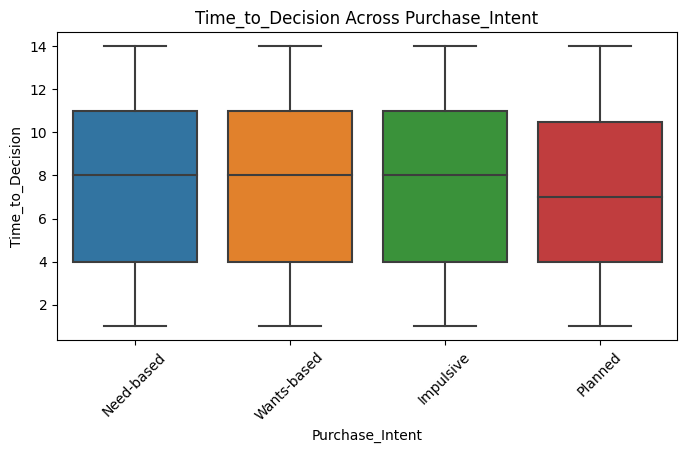

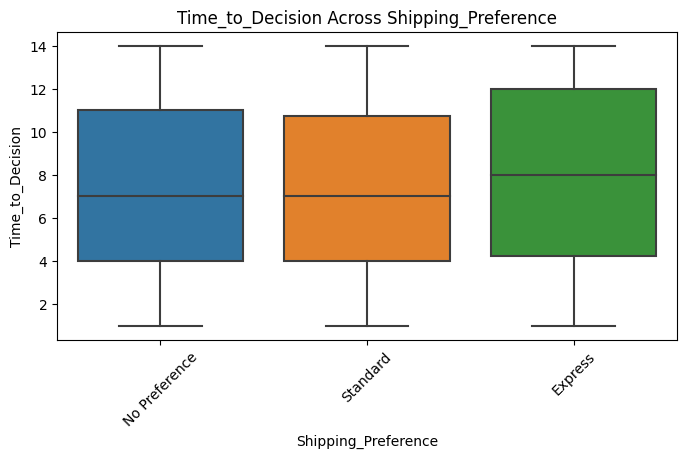

In [16]:
# Categorical vs Numerical Analysis
for num in num_features:
    for cat in cat_features:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=df, x=cat, y=num)
        plt.title(f'{num} Across {cat}')
        plt.xticks(rotation=45)
        plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

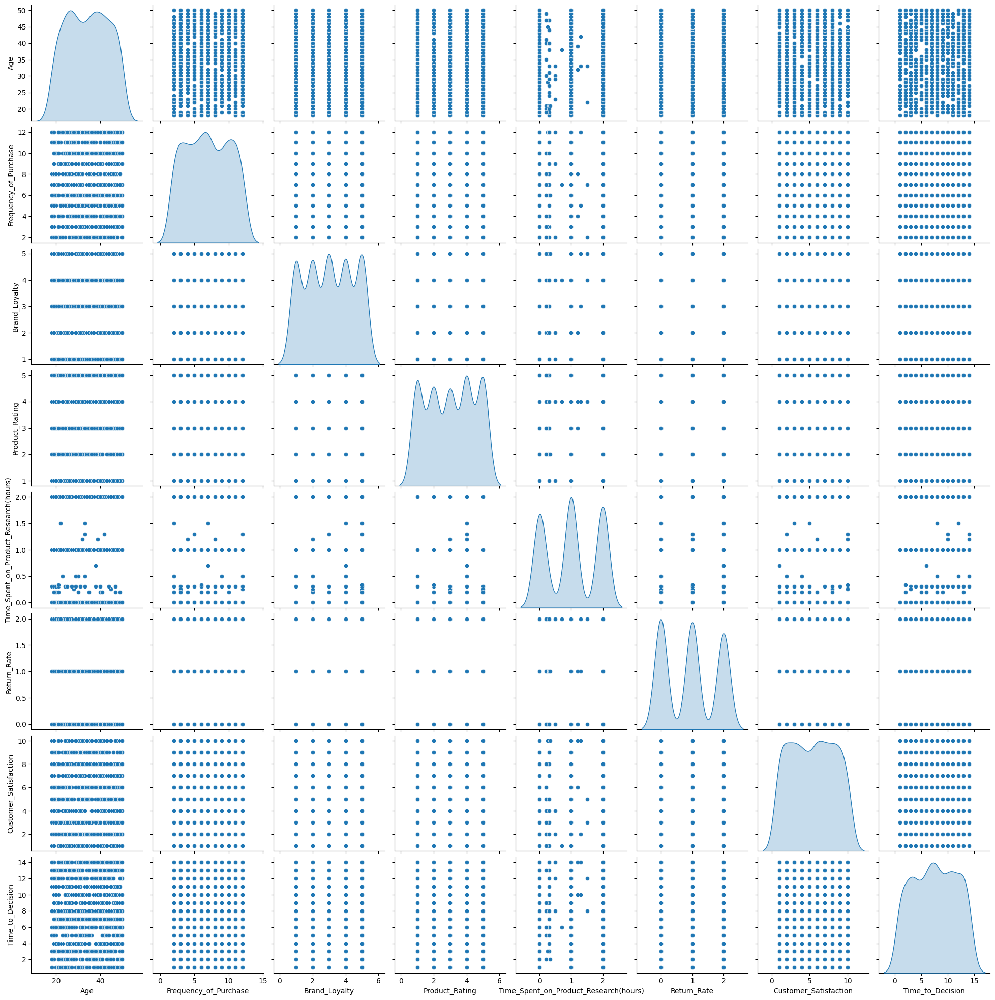

In [17]:
# Multivariate Analysis - Pair Plot
sns.pairplot(df[num_features], diag_kind="kde")
plt.show()

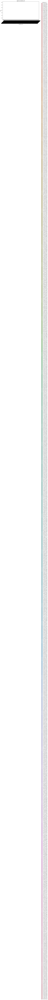

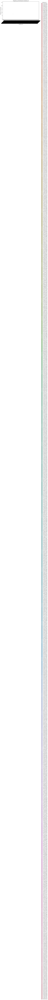

In [ ]:
# Grouped Comparisons - Boxplots
for cat in cat_features:
    for num in num_features:
        plt.figure(figsize=(10, 5))
        sns.boxplot(data=df, x=cat, y=num, hue=cat)
        plt.title(f'{num} by {cat}')
        plt.xticks(rotation=45)
        plt.legend(title=cat, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()